Note: This notebook was initially written following a tutorial from pytorch (https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html).

In [1]:
import os
import torch
import torchvision
import dataloaders
import random
import torch.nn as nn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from tqdm import tqdm
from PIL import Image
import glob
from torchsummary import summary

In [2]:
seed = 0
random.seed(seed)
torch.manual_seed(seed)

DATA_PATH = "data/tmdb-64"
TABLE_PATH = "data/tmdb-movies-220915-clean.pkl"
workers = torch.get_num_threads()
batch_size = 128
image_size = 64
number_of_channels = 3
noise_vector_size = 100
generator_feature_maps = 64
discriminator_feature_maps = 64
num_epochs = 20
learning_rate = 0.0002
beta1 = 0.5
beta2 = 0.999
ngpu = 1
number_of_samples = 64

In [3]:
output_directory = os.path.join(os.getcwd(), 'dcgan-output', datetime.now().strftime('%Y-%m-%d_%H-%M-%S'))
os.makedirs(output_directory)

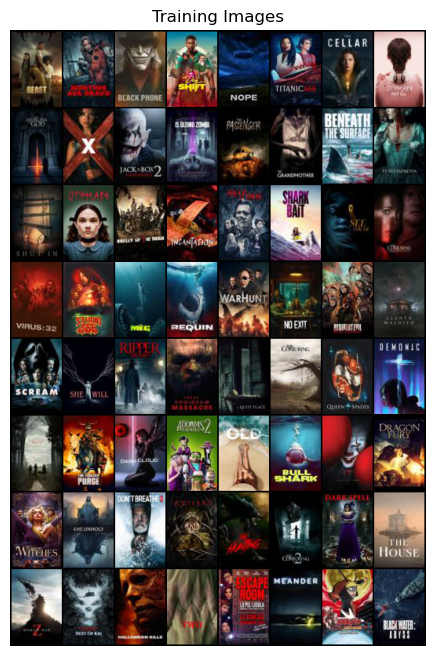

In [4]:
dataset = dataloaders.PosterDataset(table_path=TABLE_PATH, img_root_path=DATA_PATH,
                                    img_transform=transforms.Compose([
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))]),
                                    img_in_ram=False,
                                    genre=['Horror'], genre_logic='and', og_lang=None, year=None, runtime=(40,np.inf),
                                    max_num=None, sort='popularity')
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=False, num_workers=workers, pin_memory=True)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:number_of_samples], padding=2, normalize=True).cpu(),(1,2,0)))
print('The dataset has' + str(len(dataset)) + 'entries.')

In [5]:
def init_weights(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [6]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(noise_vector_size, generator_feature_maps * 8, kernel_size=(4, 4), stride=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 8),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 8, generator_feature_maps * 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 4, generator_feature_maps * 2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps * 2, generator_feature_maps, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(generator_feature_maps),
            nn.ReLU(True),
            nn.ConvTranspose2d(generator_feature_maps, number_of_channels, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)

In [7]:
generator_network = Generator(ngpu).to(device)
generator_network.apply(init_weights)
print(generator_network)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [8]:
summary(generator_network, input_size=(noise_vector_size,1,3))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 6]         819,200
       BatchNorm2d-2            [-1, 512, 4, 6]           1,024
              ReLU-3            [-1, 512, 4, 6]               0
   ConvTranspose2d-4           [-1, 256, 8, 12]       2,097,152
       BatchNorm2d-5           [-1, 256, 8, 12]             512
              ReLU-6           [-1, 256, 8, 12]               0
   ConvTranspose2d-7          [-1, 128, 16, 24]         524,288
       BatchNorm2d-8          [-1, 128, 16, 24]             256
              ReLU-9          [-1, 128, 16, 24]               0
  ConvTranspose2d-10           [-1, 64, 32, 48]         131,072
      BatchNorm2d-11           [-1, 64, 32, 48]             128
             ReLU-12           [-1, 64, 32, 48]               0
  ConvTranspose2d-13            [-1, 3, 64, 96]           3,072
             Tanh-14            [-1, 3,

In [9]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.Conv2d(number_of_channels, discriminator_feature_maps, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(discriminator_feature_maps, discriminator_feature_maps * 2, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(discriminator_feature_maps * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(discriminator_feature_maps * 2, discriminator_feature_maps * 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(discriminator_feature_maps * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(discriminator_feature_maps * 4, discriminator_feature_maps * 8, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False),
            nn.BatchNorm2d(discriminator_feature_maps * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(discriminator_feature_maps * 8, 1, kernel_size=(4, 4), stride=(1, 1), bias=False),
            nn.Conv2d(1, 1, kernel_size=(3, 1), stride=(1, 1), bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [10]:
discriminator_network = Discriminator(ngpu).to(device)
discriminator_network.apply(init_weights)
print(discriminator_network)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Conv2d(1, 1, kernel_size=(3, 1), stride=(1, 1)

In [11]:
summary(discriminator_network, input_size=(3,96,64))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 48, 32]           3,072
         LeakyReLU-2           [-1, 64, 48, 32]               0
            Conv2d-3          [-1, 128, 24, 16]         131,072
       BatchNorm2d-4          [-1, 128, 24, 16]             256
         LeakyReLU-5          [-1, 128, 24, 16]               0
            Conv2d-6           [-1, 256, 12, 8]         524,288
       BatchNorm2d-7           [-1, 256, 12, 8]             512
         LeakyReLU-8           [-1, 256, 12, 8]               0
            Conv2d-9            [-1, 512, 6, 4]       2,097,152
      BatchNorm2d-10            [-1, 512, 6, 4]           1,024
        LeakyReLU-11            [-1, 512, 6, 4]               0
           Conv2d-12              [-1, 1, 3, 1]           8,192
           Conv2d-13              [-1, 1, 1, 1]               3
          Sigmoid-14              [-1, 

In [12]:
def generate_and_save_images(generator_network, epoch, noise, img_list):
  with torch.no_grad():
    images = generator_network(noise).detach().cpu()
  fig = plt.figure(figsize=(8, 8))
  plt.axis("off")
  img_list.append(vutils.make_grid(images, padding=2, normalize=True))
  plt.imshow(np.transpose(img_list[-1],(1,2,0)))
  plt.show()
  fig.savefig(output_directory + '/image_at_epoch_{:04d}.png'.format(epoch))

def save_checkpoint(generator_network, optimizer_generator, discriminator_network, optimizer_discriminator, epoch):
  torch.save({
            'epoch': epoch,
            'generator_model_state_dict': generator_network.state_dict(),
            'generator_optimizer_state_dict': optimizer_generator.state_dict(),
            'discriminator_model_state_dict': discriminator_network.state_dict(),
            'discriminator_optimizer_state_dict': optimizer_discriminator.state_dict(),
            }, output_directory + '/gan_at_epoch_{:04d}.pt'.format(epoch))

In [13]:
loss_function = nn.BCELoss()
samples_noise = torch.randn(number_of_samples, noise_vector_size, 3, 1, device=device)

optimizer_discriminator = optim.Adam(discriminator_network.parameters(), lr=learning_rate, betas=(beta1, beta2))
optimizer_generator = optim.Adam(generator_network.parameters(), lr=learning_rate, betas=(beta1, beta2))

real_label = 1.
fake_label = 0.

[0/19]	Loss_D: 0.8602	Loss_G: 1.7479	D(x): 0.7518	D(G(z)): 0.3702 / 0.1853: 100%|██████████| 284/284 [00:30<00:00,  9.45it/s]


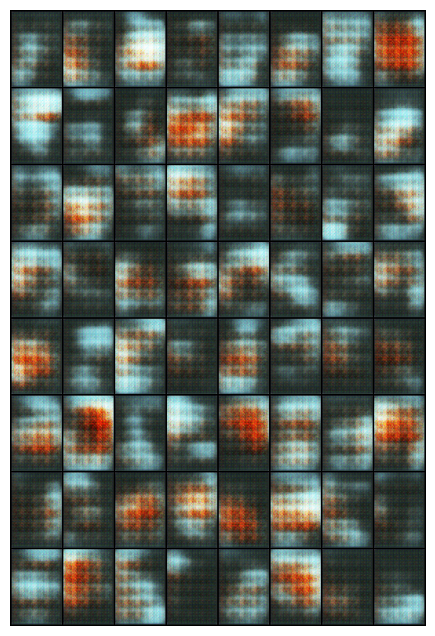

[1/19]	Loss_D: 0.7127	Loss_G: 3.9994	D(x): 0.6457	D(G(z)): 0.0782 / 0.0292: 100%|██████████| 284/284 [00:29<00:00,  9.61it/s]


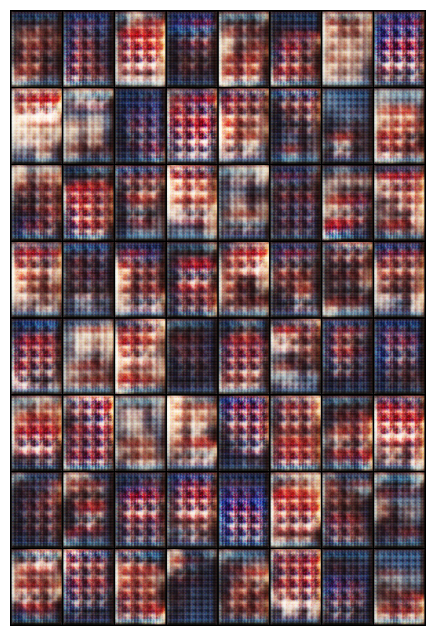

[2/19]	Loss_D: 0.4239	Loss_G: 3.5982	D(x): 0.7553	D(G(z)): 0.1019 / 0.0554: 100%|██████████| 284/284 [00:29<00:00,  9.52it/s]


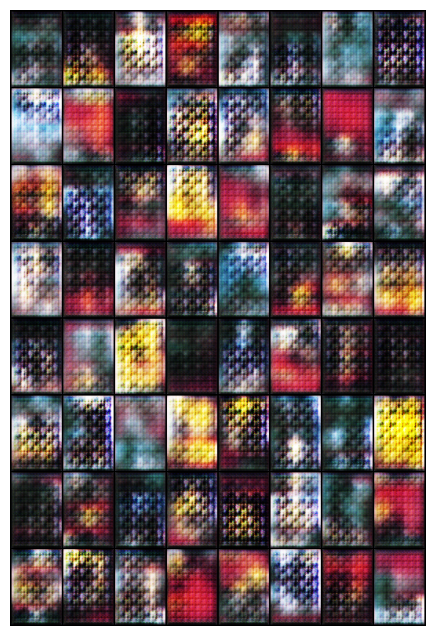

[3/19]	Loss_D: 0.9058	Loss_G: 3.7732	D(x): 0.6718	D(G(z)): 0.3440 / 0.0314: 100%|██████████| 284/284 [00:29<00:00,  9.62it/s]


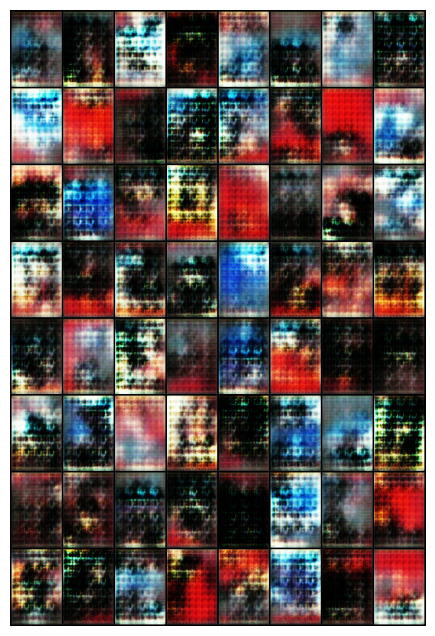

[4/19]	Loss_D: 0.5717	Loss_G: 2.9001	D(x): 0.6253	D(G(z)): 0.0409 / 0.0646: 100%|██████████| 284/284 [00:29<00:00,  9.55it/s]


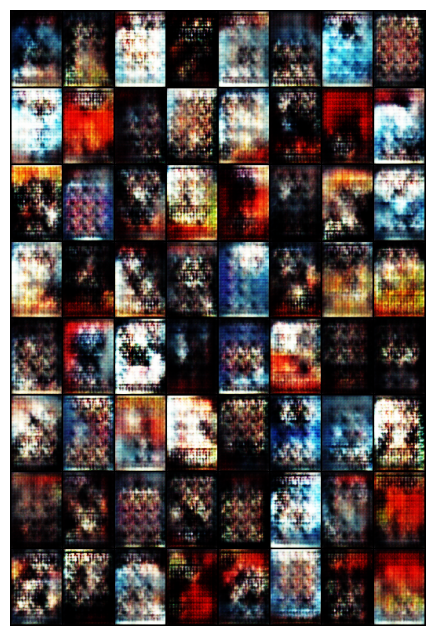

[5/19]	Loss_D: 0.4331	Loss_G: 2.2905	D(x): 0.7713	D(G(z)): 0.1114 / 0.1725: 100%|██████████| 284/284 [00:29<00:00,  9.54it/s]


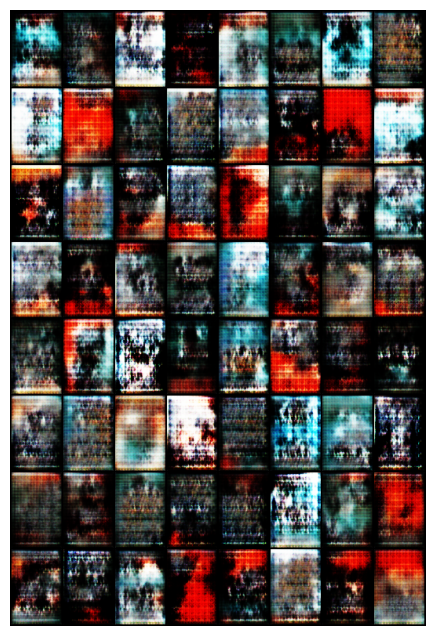

[6/19]	Loss_D: 0.3707	Loss_G: 2.3577	D(x): 0.8029	D(G(z)): 0.1050 / 0.1045: 100%|██████████| 284/284 [00:29<00:00,  9.55it/s]


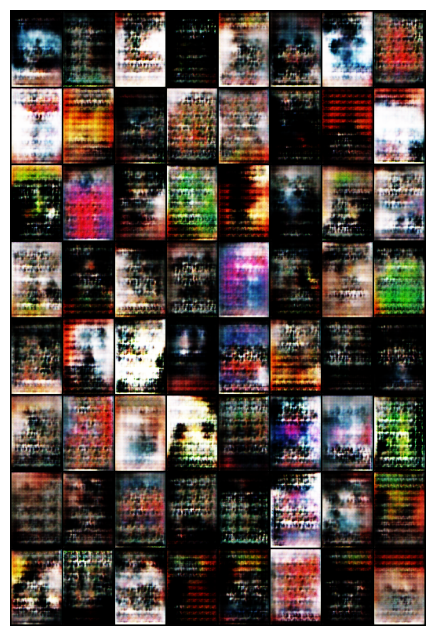

[7/19]	Loss_D: 1.0871	Loss_G: 3.8635	D(x): 0.4480	D(G(z)): 0.0046 / 0.0338: 100%|██████████| 284/284 [00:29<00:00,  9.59it/s]


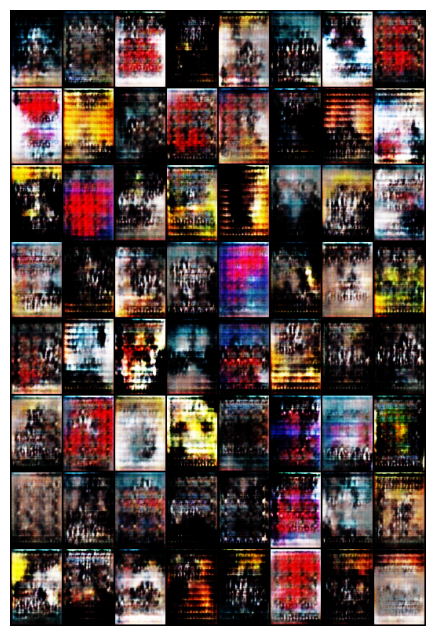

[8/19]	Loss_D: 0.8697	Loss_G: 8.1360	D(x): 0.9628	D(G(z)): 0.4273 / 0.0012: 100%|██████████| 284/284 [00:29<00:00,  9.51it/s]


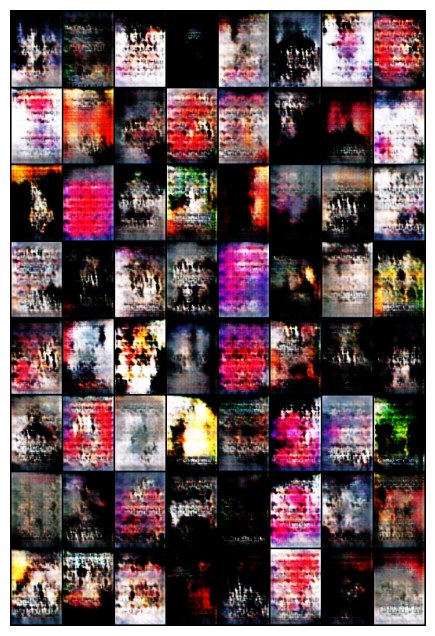

[9/19]	Loss_D: 0.6274	Loss_G: 4.0582	D(x): 0.7883	D(G(z)): 0.2912 / 0.0270: 100%|██████████| 284/284 [00:29<00:00,  9.64it/s]


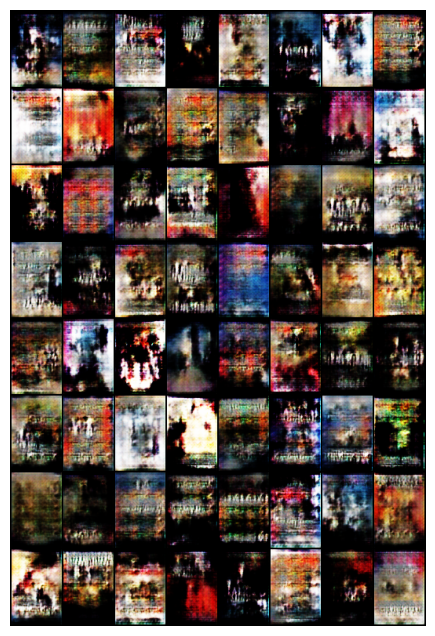

[10/19]	Loss_D: 0.1099	Loss_G: 3.1385	D(x): 0.9143	D(G(z)): 0.0172 / 0.0628: 100%|██████████| 284/284 [00:30<00:00,  9.24it/s]


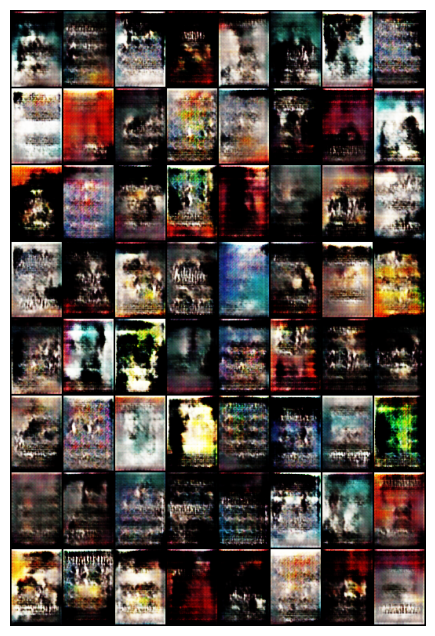

[11/19]	Loss_D: 0.8254	Loss_G: 8.2801	D(x): 0.8917	D(G(z)): 0.3965 / 0.0020: 100%|██████████| 284/284 [00:30<00:00,  9.25it/s]


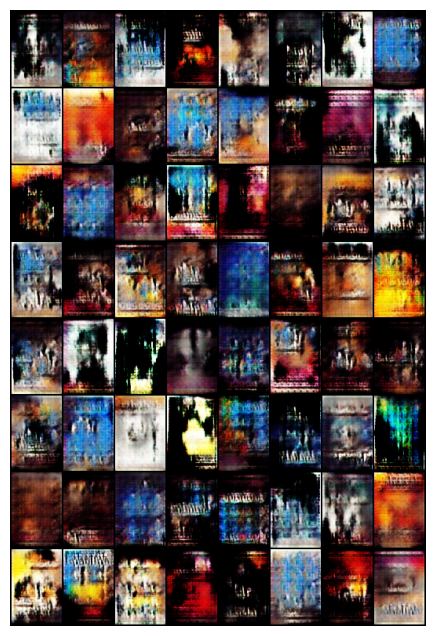

[12/19]	Loss_D: 0.5833	Loss_G: 6.0145	D(x): 0.6625	D(G(z)): 0.0032 / 0.0113: 100%|██████████| 284/284 [00:30<00:00,  9.35it/s]


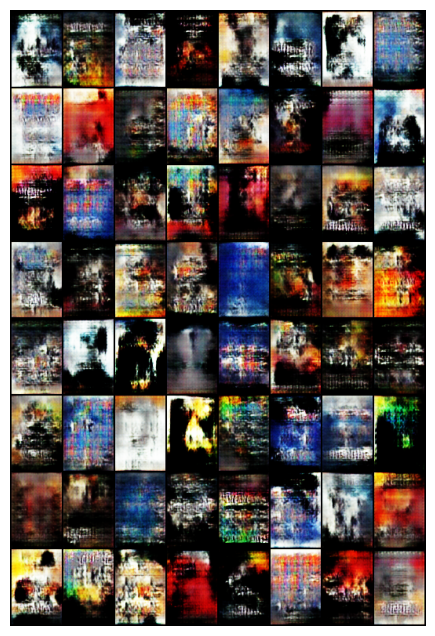

[13/19]	Loss_D: 1.6614	Loss_G: 2.7873	D(x): 0.3660	D(G(z)): 0.0042 / 0.3216: 100%|██████████| 284/284 [00:30<00:00,  9.25it/s]


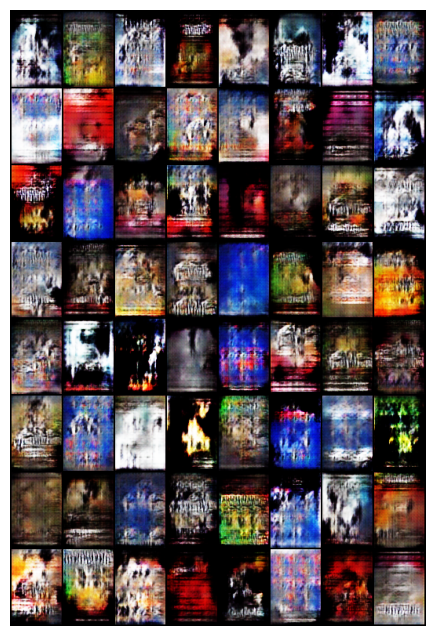

[14/19]	Loss_D: 0.3431	Loss_G: 5.8613	D(x): 0.9794	D(G(z)): 0.2516 / 0.0053: 100%|██████████| 284/284 [00:29<00:00,  9.47it/s] 


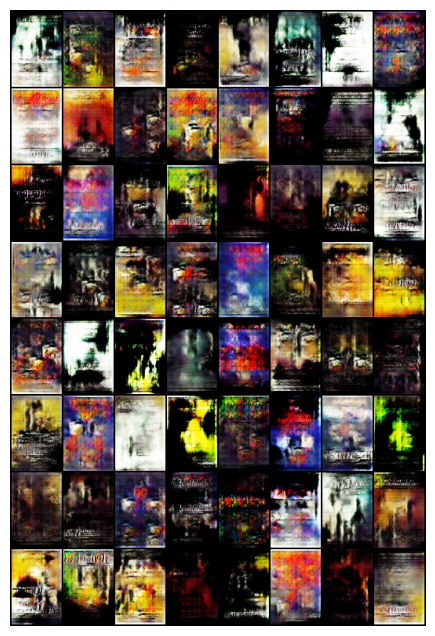

[15/19]	Loss_D: 0.3202	Loss_G: 5.6938	D(x): 0.9852	D(G(z)): 0.2313 / 0.0039: 100%|██████████| 284/284 [00:30<00:00,  9.35it/s] 


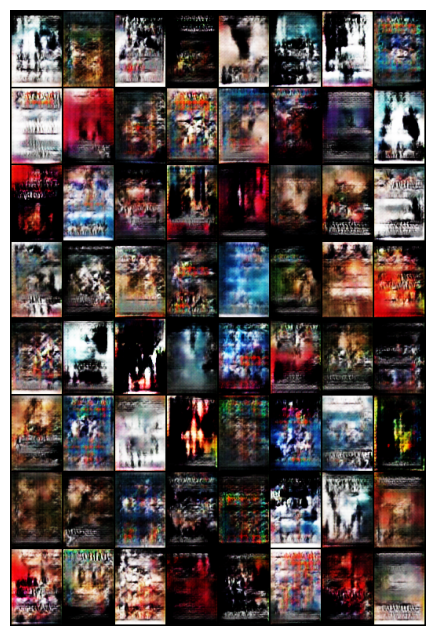

[16/19]	Loss_D: 0.2499	Loss_G: 4.7286	D(x): 0.9518	D(G(z)): 0.1663 / 0.0282: 100%|██████████| 284/284 [00:29<00:00,  9.47it/s] 


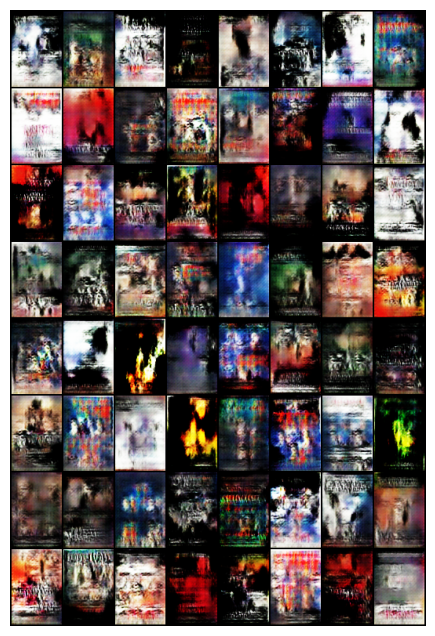

[17/19]	Loss_D: 0.0283	Loss_G: 4.8132	D(x): 0.9834	D(G(z)): 0.0114 / 0.0111: 100%|██████████| 284/284 [00:30<00:00,  9.39it/s] 


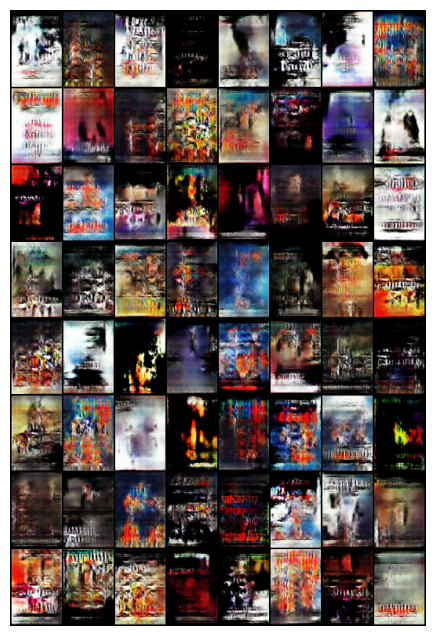

[18/19]	Loss_D: 0.1741	Loss_G: 3.5114	D(x): 0.9076	D(G(z)): 0.0530 / 0.0355: 100%|██████████| 284/284 [00:30<00:00,  9.36it/s] 


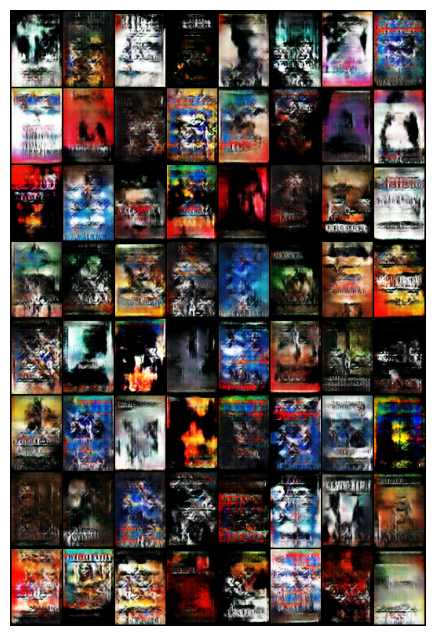

[19/19]	Loss_D: 0.2500	Loss_G: 5.2302	D(x): 0.9988	D(G(z)): 0.1774 / 0.0073: 100%|██████████| 284/284 [00:30<00:00,  9.37it/s] 


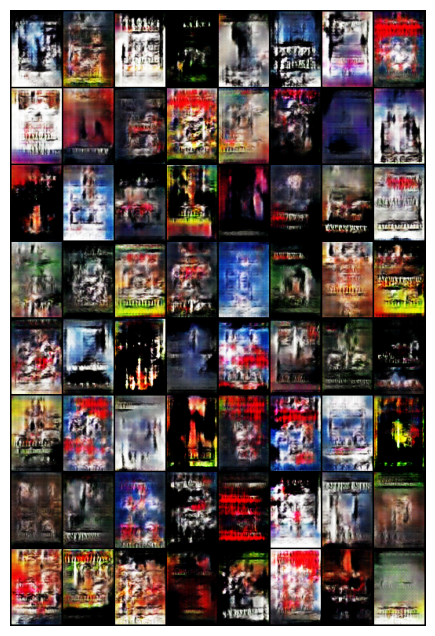

In [14]:
img_list = []
generator_losses = []
discriminator_losses = []
current_iteration = 0

for epoch in range(num_epochs):
    for i, data in enumerate(pbar := tqdm(dataloader)):

        # Train Discriminator
        discriminator_network.zero_grad()
        real = data[0].to(device)
        label = torch.full((real.size(0),), real_label, dtype=torch.float, device=device)
        output = discriminator_network(real).view(-1)
        discriminator_error_on_real = loss_function(output, label)
        discriminator_error_on_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(real.size(0), noise_vector_size, 3, 1, device=device)
        fake = generator_network(noise)
        label.fill_(fake_label)
        output = discriminator_network(fake.detach()).view(-1)
        discriminator_error_on_fake = loss_function(output, label)
        discriminator_error_on_fake.backward()
        D_G_z1 = output.mean().item()
        discriminator_error = discriminator_error_on_real + discriminator_error_on_fake
        optimizer_discriminator.step()

        # Train Generator
        generator_network.zero_grad()
        label.fill_(real_label)
        output = discriminator_network(fake).view(-1)
        generator_error = loss_function(output, label)
        generator_error.backward()
        D_G_z2 = output.mean().item()
        optimizer_generator.step()

        pbar.set_description('[%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f' % (epoch, num_epochs-1, discriminator_error.item(), generator_error.item(), D_x, D_G_z1, D_G_z2))
        generator_losses.append(generator_error.item())
        discriminator_losses.append(discriminator_error.item())

        current_iteration += 1

    generate_and_save_images(generator_network, epoch, samples_noise, img_list)
    save_checkpoint(generator_network, optimizer_generator, discriminator_network, optimizer_discriminator, epoch)

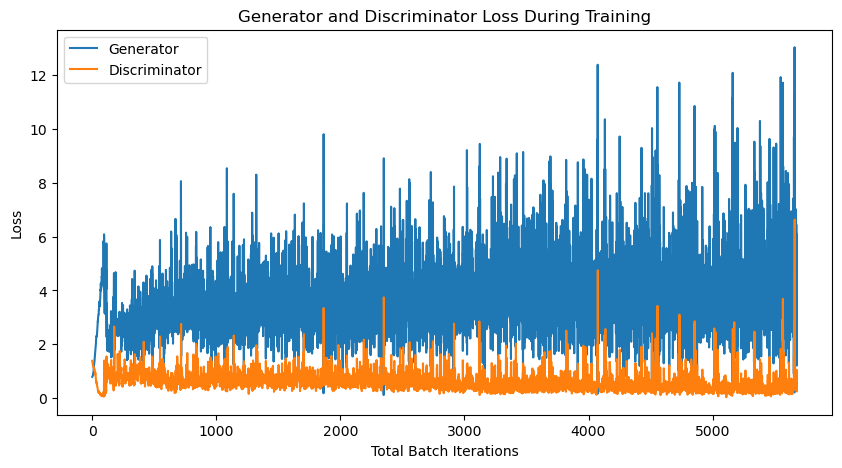

In [15]:
fig = plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(generator_losses,label="Generator")
plt.plot(discriminator_losses,label="Discriminator")
plt.xlabel("Total Batch Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()
fig.savefig(f"{output_directory}/training_loss.png")

In [16]:
sample_images = [Image.open(image) for image in glob.glob(f"{output_directory}/image*.png")]
thumbnail = sample_images[0]
thumbnail.save(f"{output_directory}/dcgan.gif", format="GIF", append_images=sample_images, save_all=True, duration=1000, loop=0)

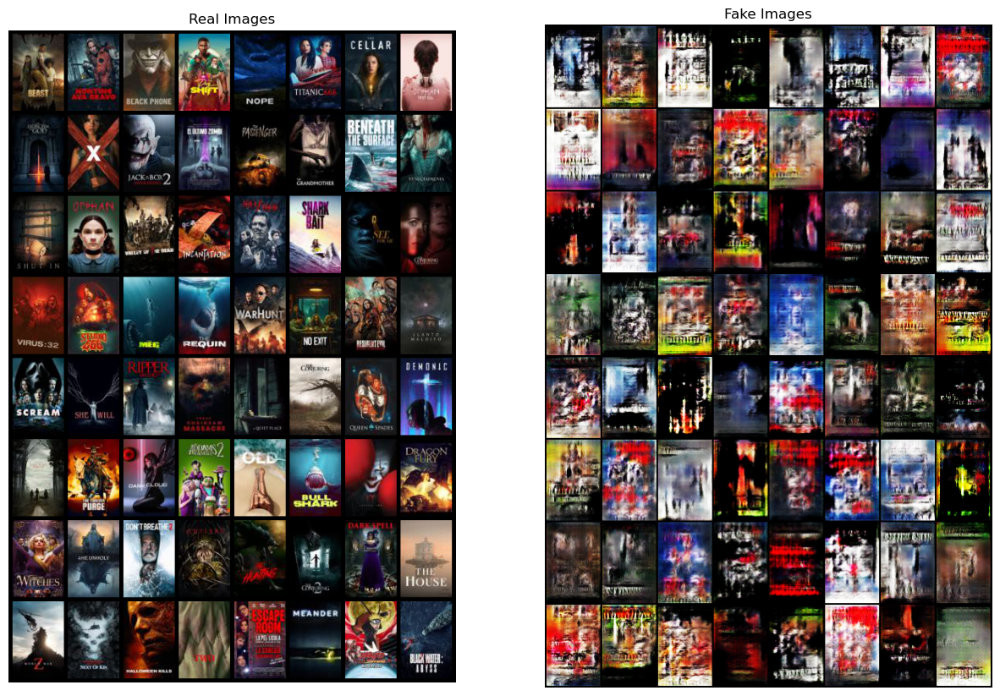

In [17]:
real = next(iter(dataloader))

fig = plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:number_of_samples], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

fig.savefig(f"{output_directory}/real_vs_fake.png")